# AlexNet

In [29]:
# импорт библиотек
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image

import os
from os import listdir

from torchvision import transforms
from torchvision.io import read_image
import torch

from torchvision.models import alexnet, AlexNet_Weights

In [30]:
# подготовка изображения
preprocess = transforms.Compose([
    transforms.Resize(256), 
    transforms.CenterCrop(224), # обрезка в квадрат
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.25, 0.25, 0.25]), # нормализация
])

In [31]:
weights_alexnet = AlexNet_Weights.IMAGENET1K_V1
model = alexnet(weights_alexnet)

In [32]:
def model_alexnet(input_img):

  n = 5
  # массив для топ-5 предсказаний с вероятностями
  list_top5_preds = []

  image = preprocess(input_img).unsqueeze(0)  

  # ускорение алгоритма
  if torch.cuda.is_available():
    image = image.to('cuda')
    model.to('cuda')

  # выполнение предсказания  
  prediction = model(image).squeeze(0).softmax(0)
  class_id = torch.topk(prediction.flatten(), n).indices

  # вывод топ-5 предсказаний с вероятностями
  for i in range(n):
    top5_prob = prediction[class_id[i]].item()
    top5_categ = weights_alexnet.meta["categories"][class_id[i]]
    print(f"{top5_categ}: {100 * top5_prob:.1f}%")
    list_top5_preds.append(top5_categ)

  return list_top5_preds

In [33]:
# Функция, вычисляющая top-5 accuracy и top-1 accuracy 
def get_acc(network_architecture):

    folder_dir = "D:/Study/magistry/sem_1/computer_vision/ComputerVision/Lab3/dataset"

    top_5_acc_num = 0 
    top_1_acc_num = 0 
    count_images = 0

    for file_name in os.listdir(folder_dir):
            count_images += 1
            if (file_name.endswith(".jpg")):
                img = Image.open(folder_dir + '/' + file_name)
                top5_preds = network_architecture(img)
                real_class_img = (file_name[file_name.find('_') + 1 : file_name.find('.')])
                if real_class_img in top5_preds:
                    top_5_acc_num +=  1
                if real_class_img in top5_preds[0]:
                    top_1_acc_num += 1
                # else: print('no match')
    
    return top_5_acc_num/count_images , top_1_acc_num/count_images

In [34]:
def print_result_classification(model):
  folder_dir = "D:/Study/magistry/sem_1/computer_vision/ComputerVision/Lab3/dataset"
  for image in os.listdir(folder_dir):
        if (image.endswith(".jpg")):
          input_image = Image.open(folder_dir+'/'+image)
          img = plt.imread(folder_dir+'/'+image)
          plt.figure(figsize=(10,5),dpi=80)
          model(input_image)
          plt.imshow(img)
          plt.axis('off')
          plt.show()

African elephant: 84.0%
Indian elephant: 13.0%
Arabian camel: 2.6%
tusker: 0.4%
bighorn: 0.0%


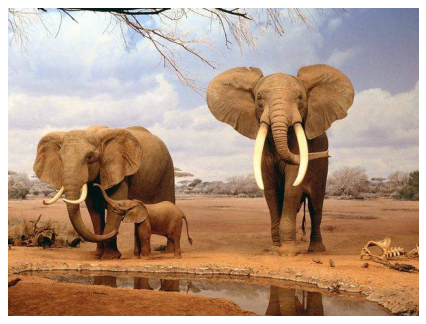

airliner: 98.3%
wing: 1.7%
warplane: 0.0%
missile: 0.0%
projectile: 0.0%


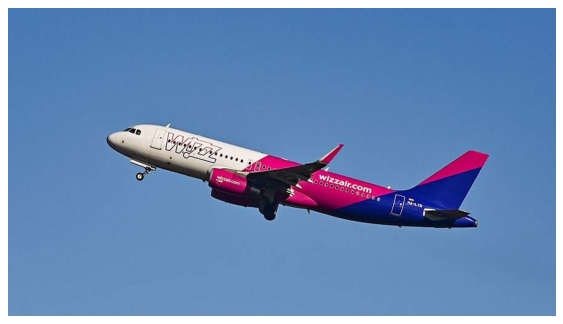

airliner: 98.7%
wing: 0.8%
airship: 0.3%
warplane: 0.1%
missile: 0.0%


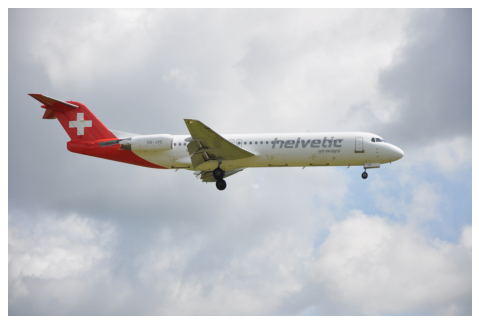

tank: 37.2%
sulphur-crested cockatoo: 7.9%
chainlink fence: 7.8%
magpie: 7.4%
missile: 6.3%


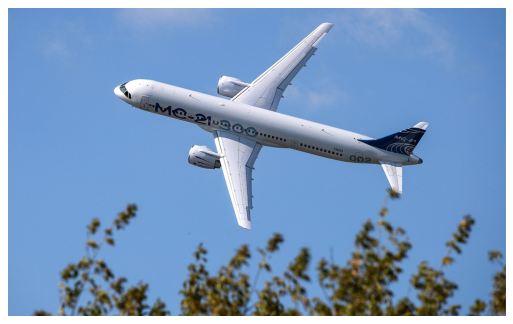

oboe: 11.7%
banjo: 10.4%
bow: 10.2%
assault rifle: 9.6%
scabbard: 7.4%


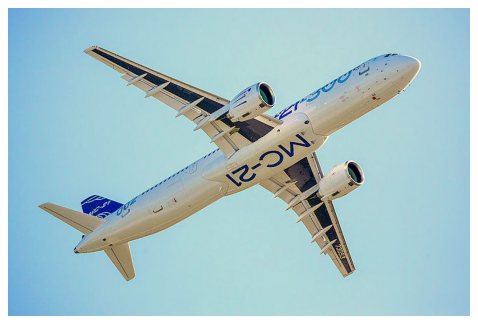

airliner: 88.3%
wing: 9.5%
warplane: 0.7%
airship: 0.5%
radio telescope: 0.3%


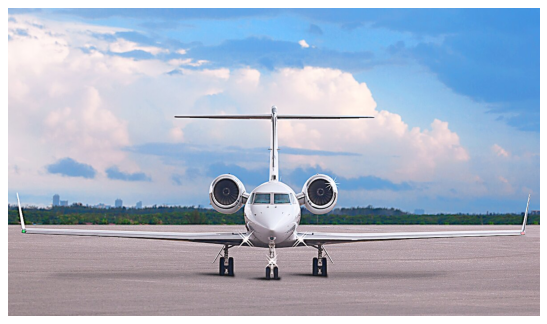

airliner: 24.7%
albatross: 19.7%
wing: 13.8%
warplane: 13.2%
hammerhead: 9.1%


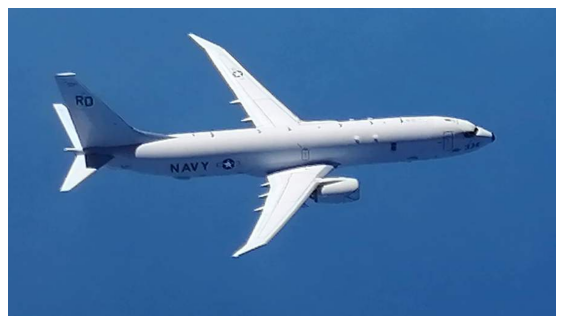

airliner: 84.4%
warplane: 7.7%
space shuttle: 7.2%
wing: 0.6%
airship: 0.1%


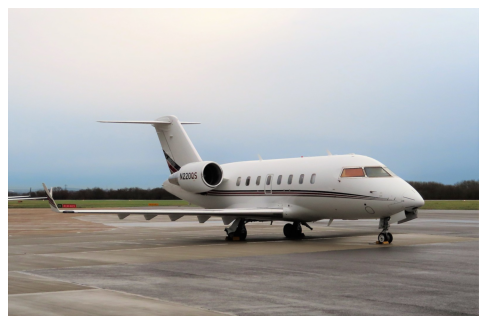

airliner: 31.7%
wing: 29.3%
radio telescope: 18.5%
airship: 16.0%
space shuttle: 1.8%


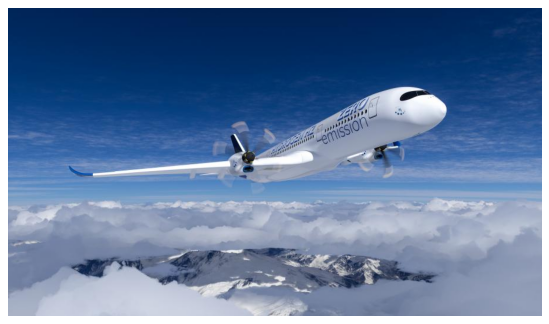

space shuttle: 53.4%
airliner: 45.5%
radio telescope: 0.2%
projectile: 0.1%
warplane: 0.1%


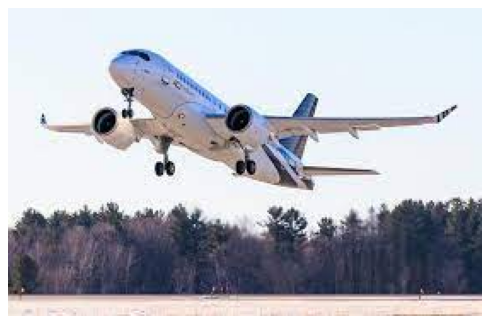

tusker: 45.2%
Indian elephant: 39.8%
African elephant: 12.3%
bison: 2.0%
hippopotamus: 0.4%


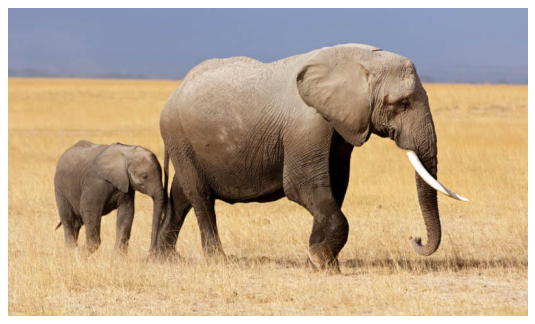

airliner: 69.7%
warplane: 14.6%
space shuttle: 9.5%
aircraft carrier: 2.7%
wing: 2.6%


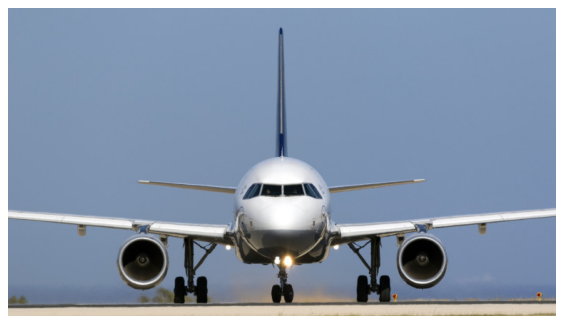

lemon: 62.7%
orange: 37.3%
honeycomb: 0.0%
butternut squash: 0.0%
pill bottle: 0.0%


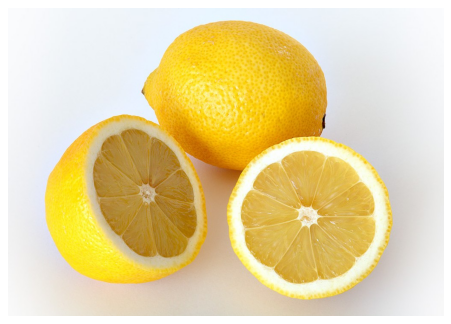

corn: 24.6%
ear: 18.7%
lemon: 8.7%
strainer: 7.4%
pineapple: 6.4%


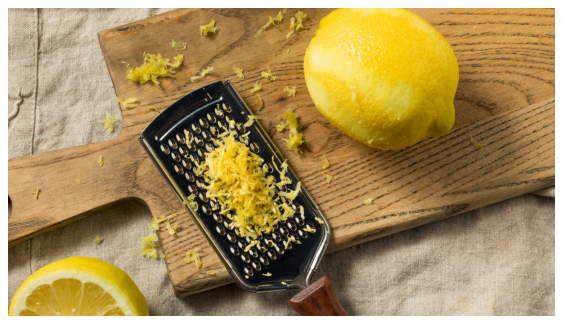

honeycomb: 88.4%
lemon: 6.2%
orange: 3.1%
envelope: 0.4%
velvet: 0.4%


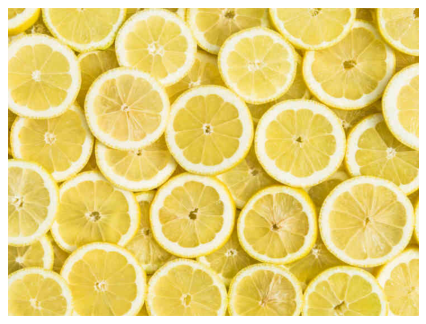

lemon: 93.8%
orange: 5.7%
pineapple: 0.2%
bell pepper: 0.1%
spaghetti squash: 0.0%


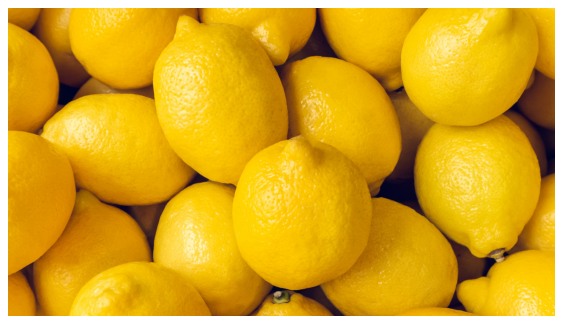

lemon: 69.5%
orange: 30.5%
bell pepper: 0.0%
yellow lady's slipper: 0.0%
Granny Smith: 0.0%


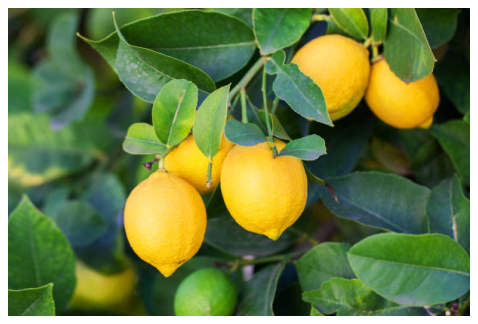

lemon: 59.1%
bell pepper: 37.7%
butternut squash: 1.1%
orange: 0.6%
spaghetti squash: 0.3%


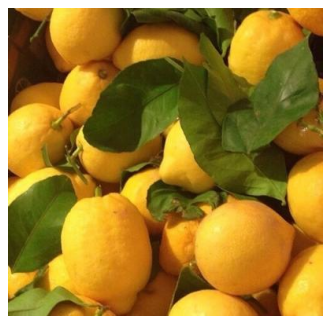

dalmatian: 89.5%
German short-haired pointer: 5.1%
English setter: 1.7%
Great Dane: 1.0%
kimono: 1.0%


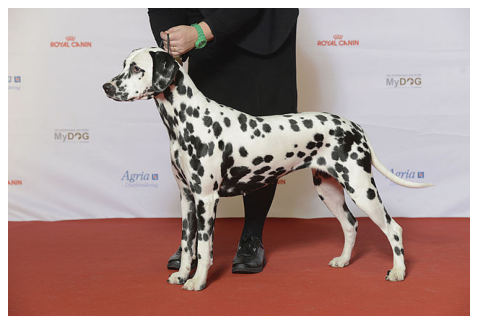

Pomeranian: 100.0%
Pembroke: 0.0%
chow: 0.0%
keeshond: 0.0%
Pekinese: 0.0%


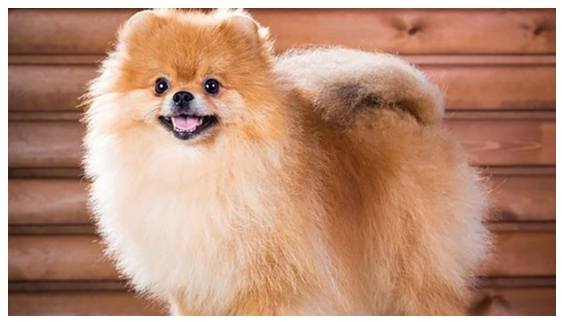

golden retriever: 50.9%
Labrador retriever: 27.9%
kuvasz: 10.3%
Great Pyrenees: 6.0%
Eskimo dog: 3.6%


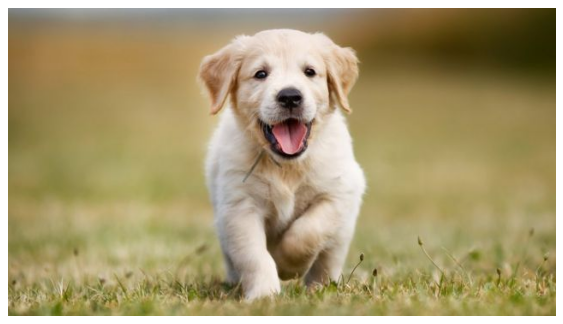

African elephant: 61.7%
Indian elephant: 25.5%
tusker: 12.8%
hippopotamus: 0.0%
megalith: 0.0%


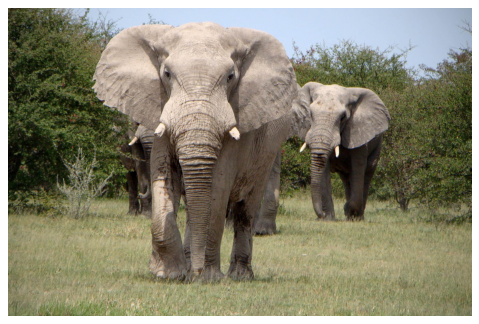

Appenzeller: 60.5%
Bernese mountain dog: 26.9%
collie: 5.3%
Border collie: 4.8%
Greater Swiss Mountain dog: 1.1%


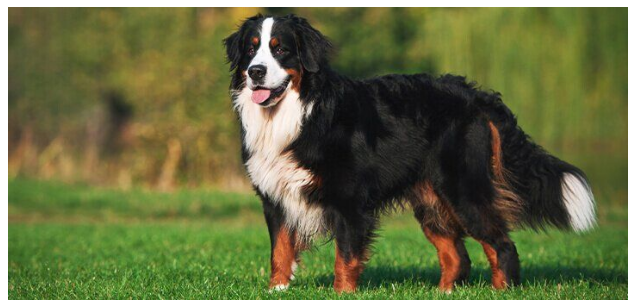

dingo: 89.7%
basenji: 6.9%
miniature pinscher: 0.7%
Ibizan hound: 0.5%
kelpie: 0.5%


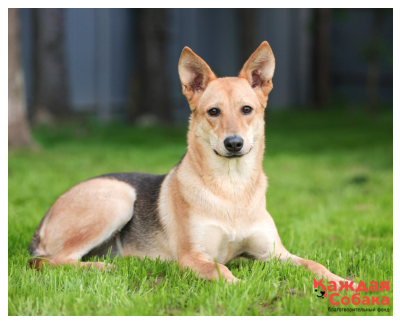

dalmatian: 78.0%
Great Dane: 21.9%
English setter: 0.1%
German short-haired pointer: 0.0%
muzzle: 0.0%


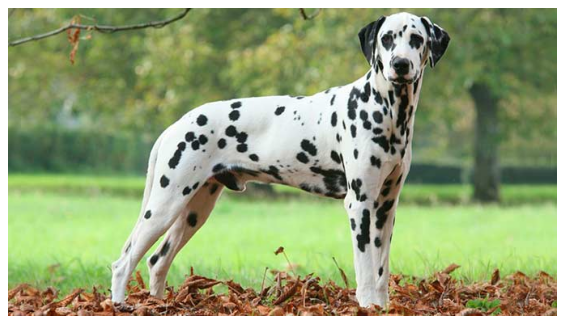

basenji: 98.7%
dingo: 0.8%
Ibizan hound: 0.2%
dhole: 0.2%
Chihuahua: 0.0%


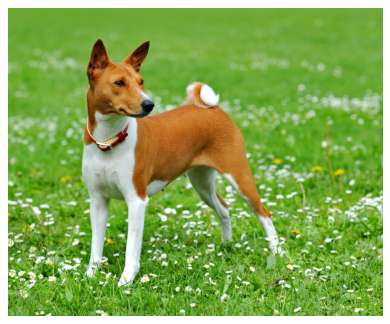

collie: 96.6%
Shetland sheepdog: 3.4%
papillon: 0.0%
Persian cat: 0.0%
Pomeranian: 0.0%


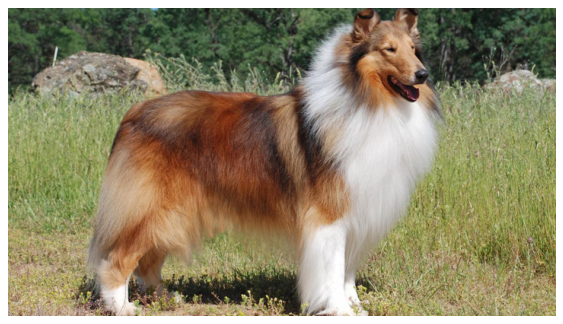

tabby: 72.6%
tiger cat: 20.3%
Egyptian cat: 5.9%
lynx: 1.0%
Persian cat: 0.1%


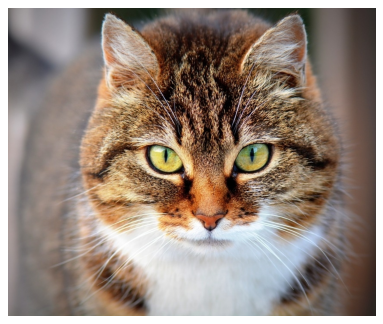

Samoyed: 98.6%
Great Pyrenees: 0.6%
Pomeranian: 0.4%
chow: 0.2%
kuvasz: 0.1%


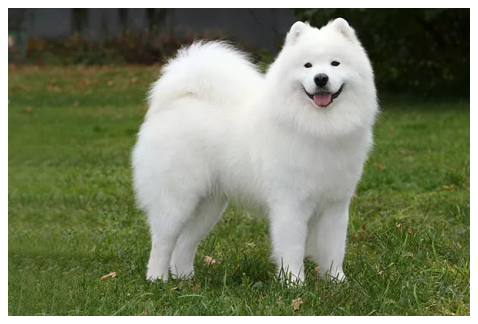

Persian cat: 75.6%
tabby: 19.9%
Egyptian cat: 2.4%
tiger cat: 1.6%
tiger: 0.2%


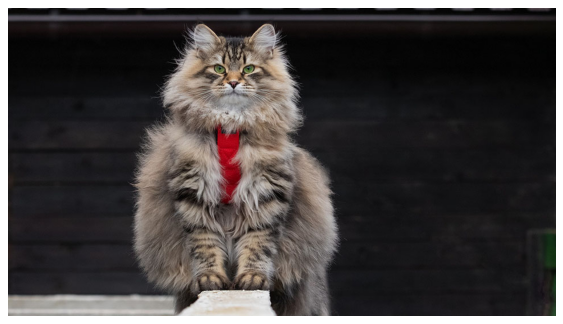

tabby: 49.3%
Egyptian cat: 28.3%
tiger cat: 11.3%
lynx: 4.4%
Persian cat: 3.4%


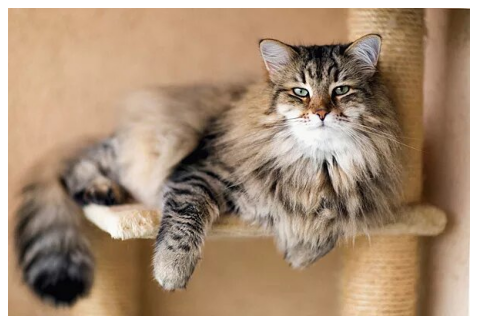

Egyptian cat: 43.6%
tiger cat: 23.9%
lynx: 16.0%
tabby: 7.8%
cougar: 6.8%


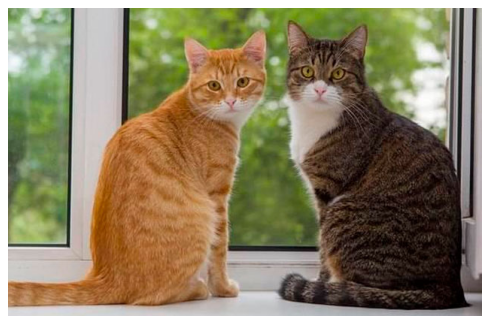

tusker: 83.3%
Indian elephant: 12.1%
African elephant: 4.5%
triceratops: 0.0%
water buffalo: 0.0%


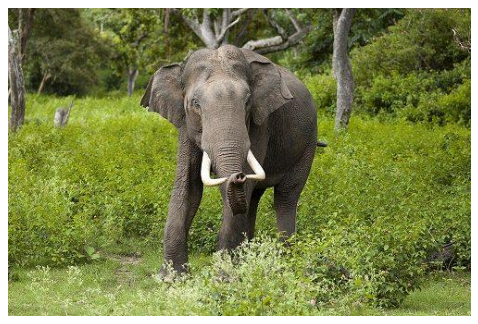

tiger cat: 22.6%
tabby: 10.5%
crate: 8.6%
cup: 6.6%
carton: 5.3%


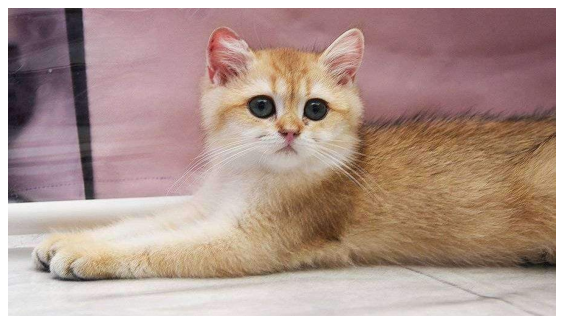

Samoyed: 99.5%
Arctic fox: 0.2%
Great Pyrenees: 0.1%
Eskimo dog: 0.1%
Pomeranian: 0.0%


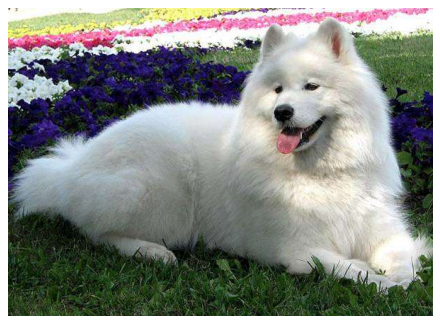

Egyptian cat: 58.6%
tiger cat: 23.0%
lynx: 14.6%
tabby: 2.4%
caldron: 0.4%


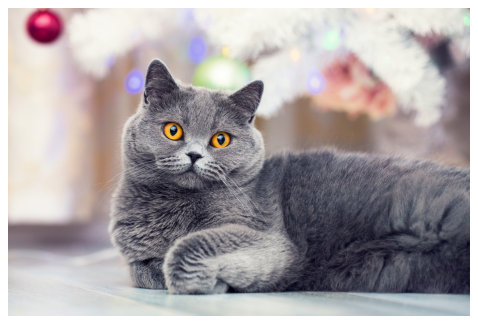

patio: 59.0%
mobile home: 14.6%
picket fence: 6.4%
beacon: 1.7%
bannister: 1.5%


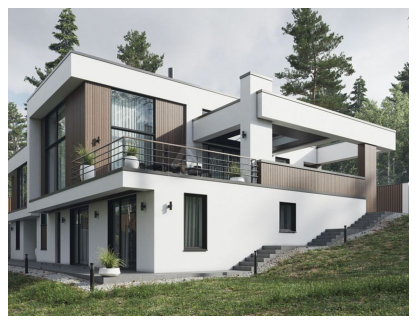

koala: 99.8%
titi: 0.1%
indri: 0.0%
guenon: 0.0%
marmoset: 0.0%


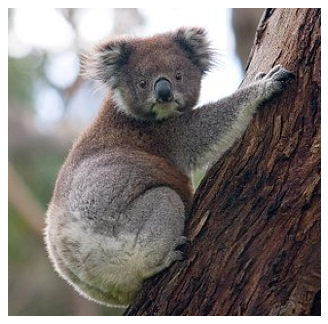

koala: 99.9%
indri: 0.0%
Madagascar cat: 0.0%
titi: 0.0%
gibbon: 0.0%


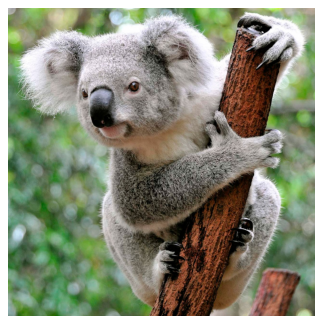

abacus: 100.0%
tray: 0.0%
space bar: 0.0%
panpipe: 0.0%
doormat: 0.0%


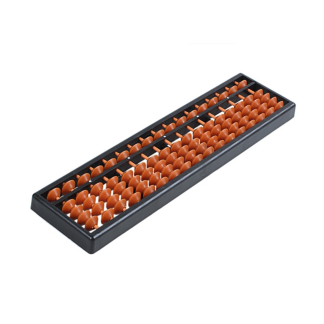

carton: 74.5%
desk: 7.1%
crate: 5.2%
hamper: 2.6%
ashcan: 1.3%


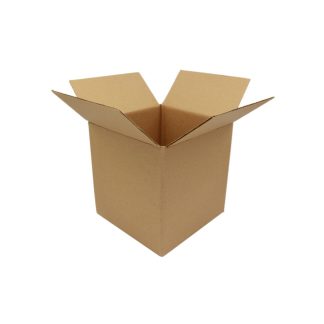

library: 47.5%
palace: 19.0%
vault: 6.5%
organ: 5.9%
bookshop: 5.1%


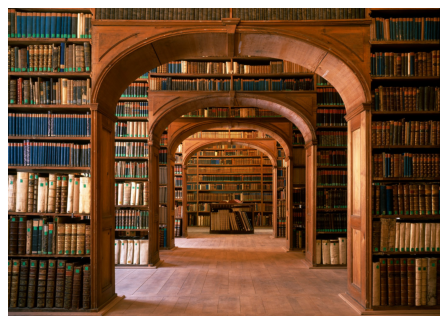

library: 51.8%
bookshop: 26.3%
bookcase: 18.7%
beer bottle: 0.6%
chocolate sauce: 0.4%


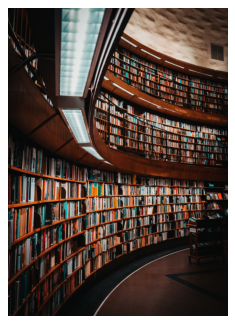

African elephant: 94.3%
tusker: 4.1%
Indian elephant: 1.6%
Arabian camel: 0.0%
triceratops: 0.0%


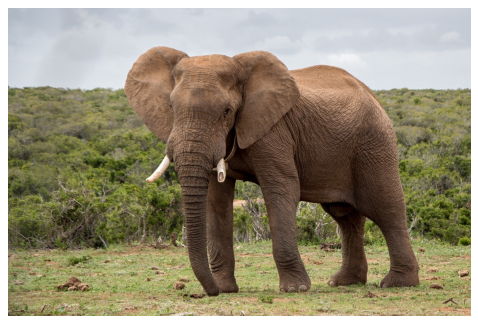

library: 82.6%
bookshop: 6.1%
grocery store: 6.0%
lumbermill: 2.8%
restaurant: 0.8%


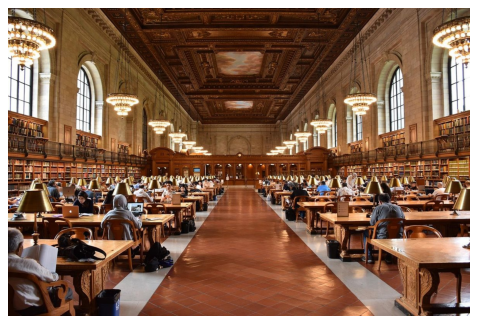

tusker: 62.6%
African elephant: 33.8%
Indian elephant: 3.6%
Arabian camel: 0.0%
warthog: 0.0%


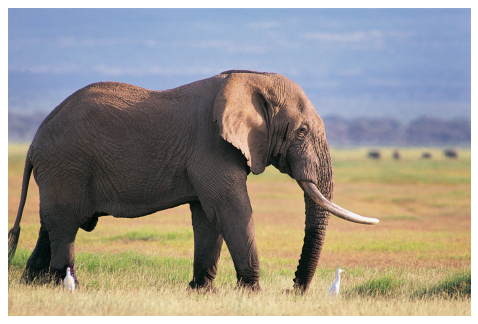

African elephant: 99.4%
tusker: 0.3%
Indian elephant: 0.3%
zebra: 0.0%
trilobite: 0.0%


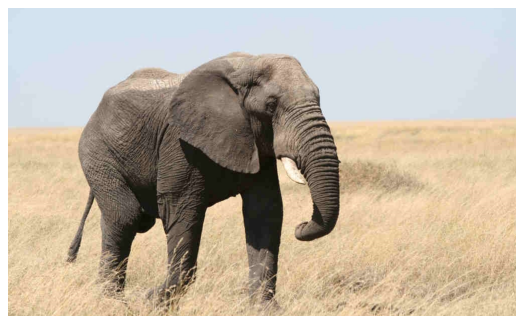

Great Dane: 53.8%
Labrador retriever: 12.0%
Staffordshire bullterrier: 5.5%
Weimaraner: 4.2%
kelpie: 3.9%


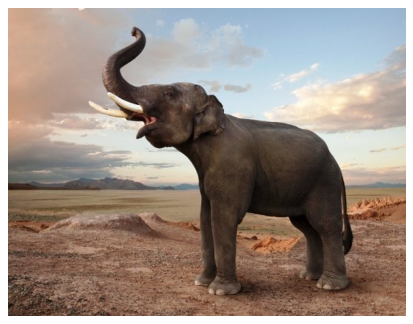

Indian elephant: 60.4%
African elephant: 27.9%
tusker: 11.6%
water buffalo: 0.0%
hippopotamus: 0.0%


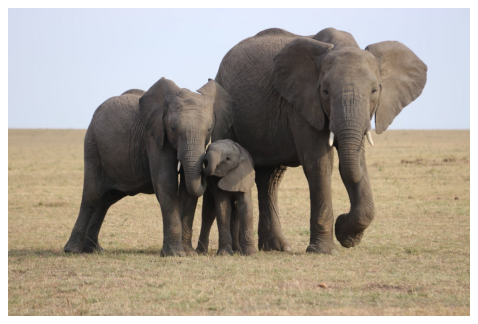

Arabian camel: 89.3%
megalith: 3.1%
kuvasz: 2.7%
ox: 2.2%
African elephant: 1.0%


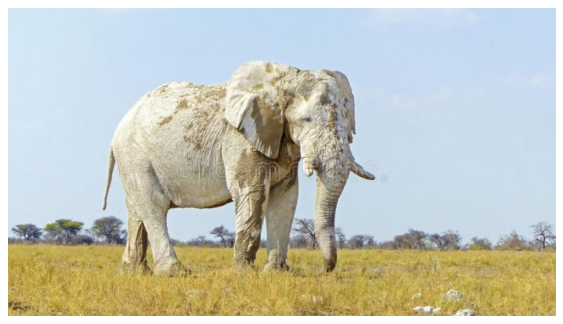

African elephant: 88.8%
Indian elephant: 7.4%
tusker: 2.8%
Arabian camel: 0.9%
warthog: 0.1%
airliner: 90.9%
wing: 8.5%
warplane: 0.6%
flagpole: 0.0%
missile: 0.0%
airliner: 98.3%
wing: 1.4%
warplane: 0.2%
airship: 0.1%
projectile: 0.0%
airliner: 56.1%
missile: 10.1%
projectile: 9.2%
tank: 8.7%
chainlink fence: 6.9%
banjo: 30.4%
electric guitar: 16.7%
flute: 10.7%
oboe: 10.6%
bow: 9.0%
airliner: 96.2%
wing: 3.5%
warplane: 0.1%
binoculars: 0.1%
airship: 0.0%
airliner: 65.6%
wing: 17.1%
albatross: 6.5%
hammerhead: 3.6%
space shuttle: 1.9%
airliner: 88.1%
warplane: 10.2%
wing: 1.3%
space shuttle: 0.3%
missile: 0.0%
airliner: 30.7%
wing: 18.3%
radio telescope: 16.7%
airship: 10.1%
liner: 7.5%
space shuttle: 83.1%
airliner: 16.5%
radio telescope: 0.2%
warplane: 0.1%
airship: 0.0%
Indian elephant: 61.0%
African elephant: 31.3%
tusker: 5.7%
bison: 1.8%
water buffalo: 0.1%
airliner: 76.4%
warplane: 9.9%
wing: 6.6%
airship: 2.4%
space shuttle: 1.2%
lemon: 73.5%
orange: 26.5%
pill bottle: 0.0%
i

In [35]:
%%time
print_result_classification(model_alexnet)
top_5_acc, top_1_acc = get_acc(model_alexnet)
print(f'Top-5 accuracy: {100 * top_5_acc:.1f}% \nTop-1 accuracy: {100 * top_1_acc:.1f}%') 